##  Inference on Test Images


The initial model load and first inference incur additional overhead due to
model initialisation and graph tracing. Subsequent inferences run faster.


In [1]:
%matplotlib inline

import os
import time
import warnings

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display


from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

warnings.filterwarnings("ignore")
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
tf.get_logger().setLevel("ERROR")

In [2]:
# GPU setup 

gpus = tf.config.experimental.list_physical_devices("GPU")
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError:
        # Runtime already initialized (e.g., TF was used earlier in the notebook)
        pass

In [3]:
# PATHS

IMAGE_DIR = "test_images/"
PATH_TO_SAVED_MODEL = "./training/TF2/training/faster_rcnn_resnet101_v1_1024x1024_coco17_tpu-8/saved_model/saved_model"
PATH_TO_LABELS = "./data/label_map.pbtxt"

Loading SavedModel... Done (65.93s)
Warming up... Done

Running inference for test_images/OryxGazella_KAR_S1_E02_R1_IMAG2530.jpg...
Inference time: 0.061s


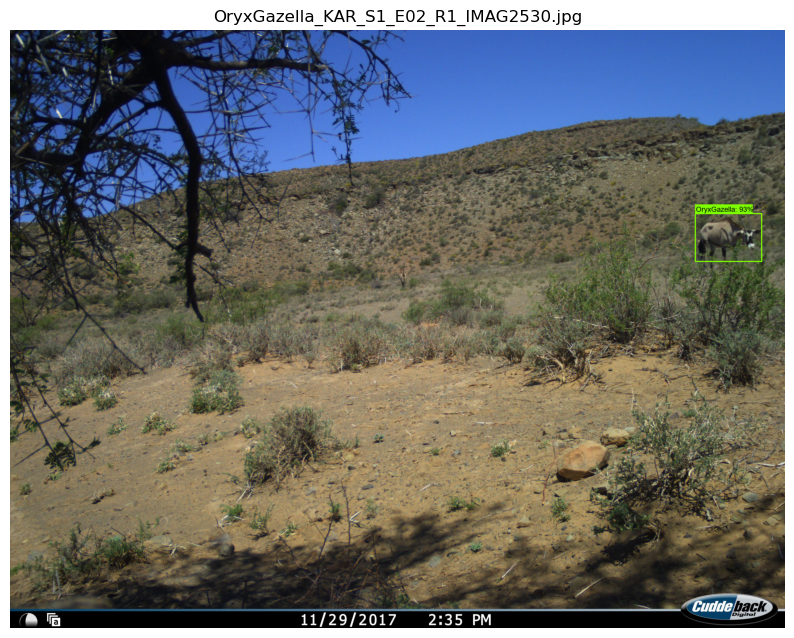


Running inference for test_images/OryxGazella_KAR_S1_E03_R1_IMAG0048.jpg...
Inference time: 0.067s


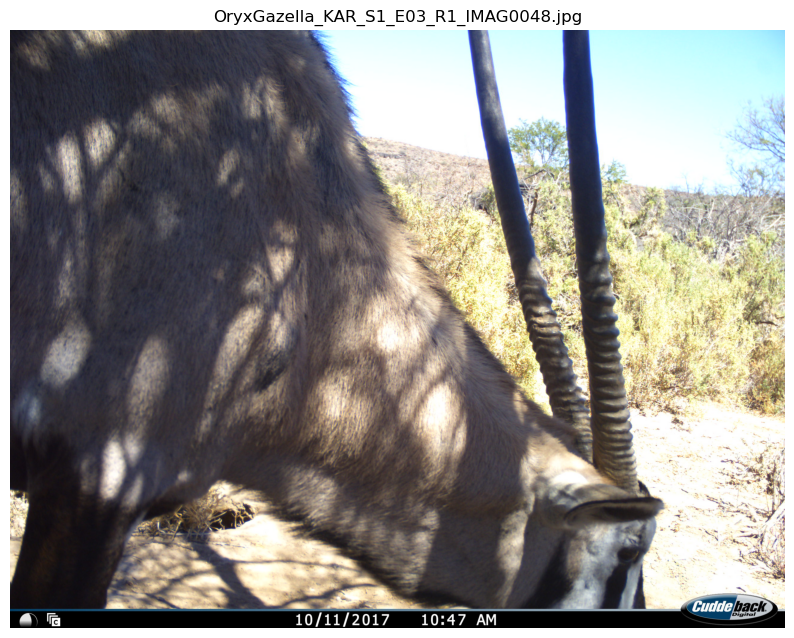


Running inference for test_images/OryxGazella_KGA_S1_A06_R1_IMAG0177.jpg...
Inference time: 0.067s


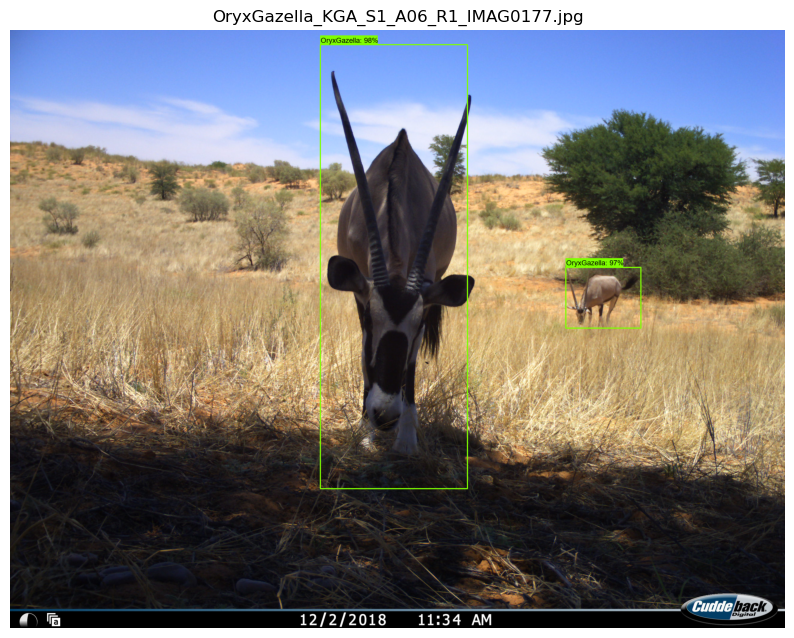


Running inference for test_images/PantheraLeo4835.jpg...
Inference time: 0.066s


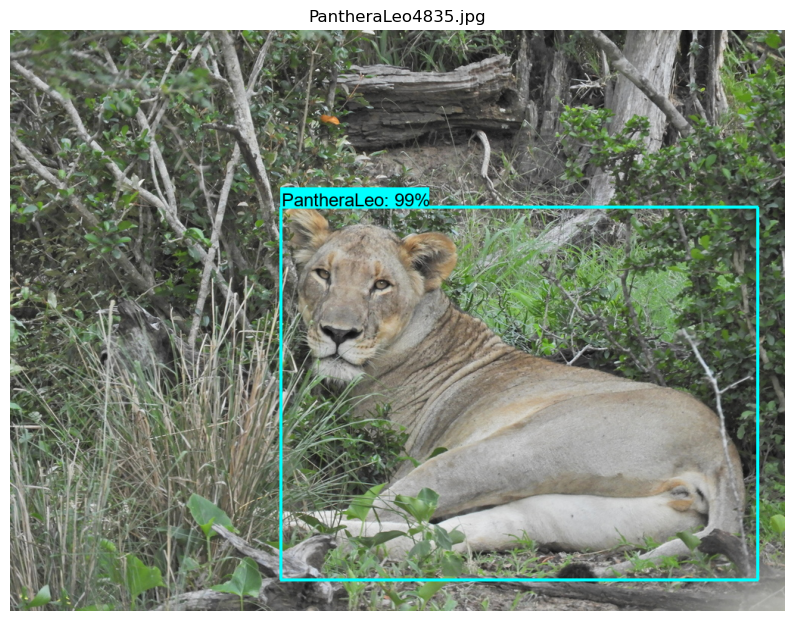


Running inference for test_images/PantheraLeo4883.jpg...
Inference time: 0.066s


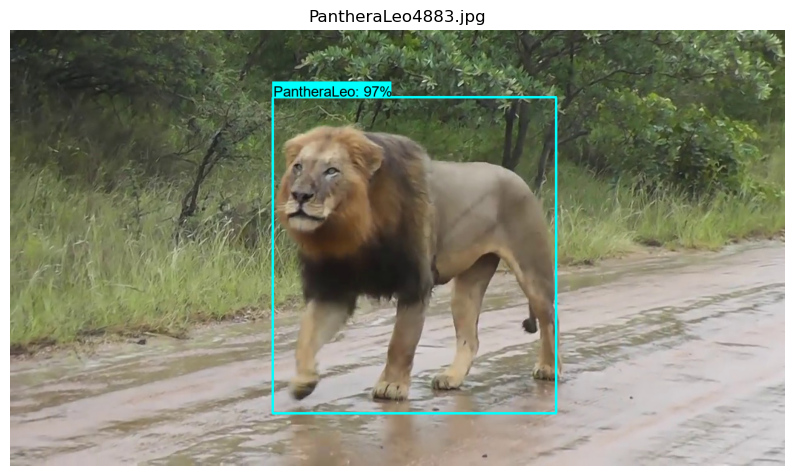


Running inference for test_images/PantheraLeo4895.jpg...
Inference time: 0.065s


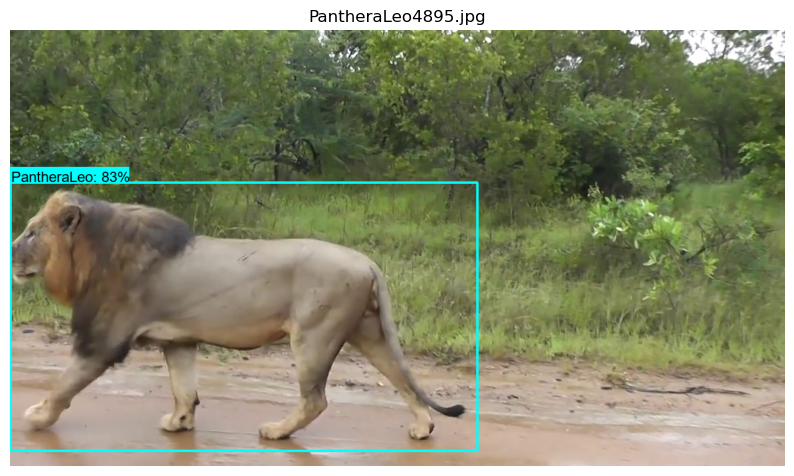


Running inference for test_images/PhacochoerusAfricanus_LMA1_19NR12__20201216__162415.jpg...
Inference time: 0.061s


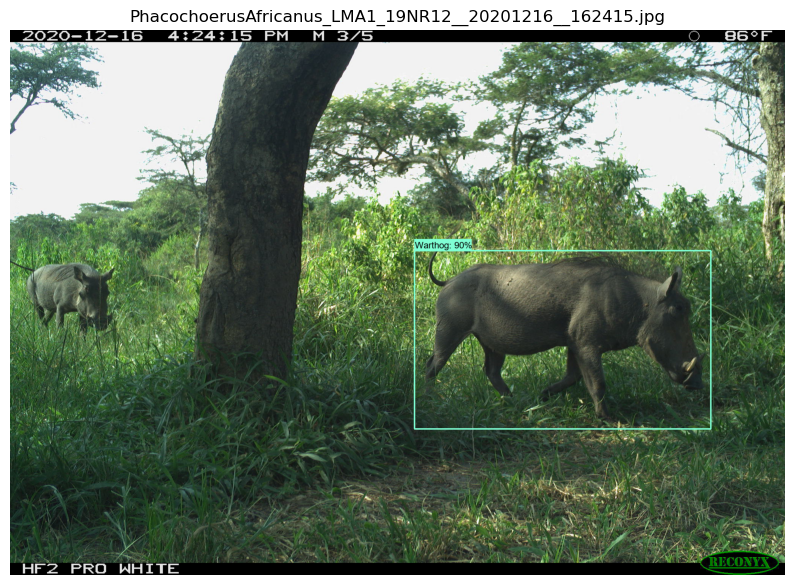


Running inference for test_images/PhacochoerusAfricanus_LMA1_19NR12__20201218__174153.jpg...
Inference time: 0.063s


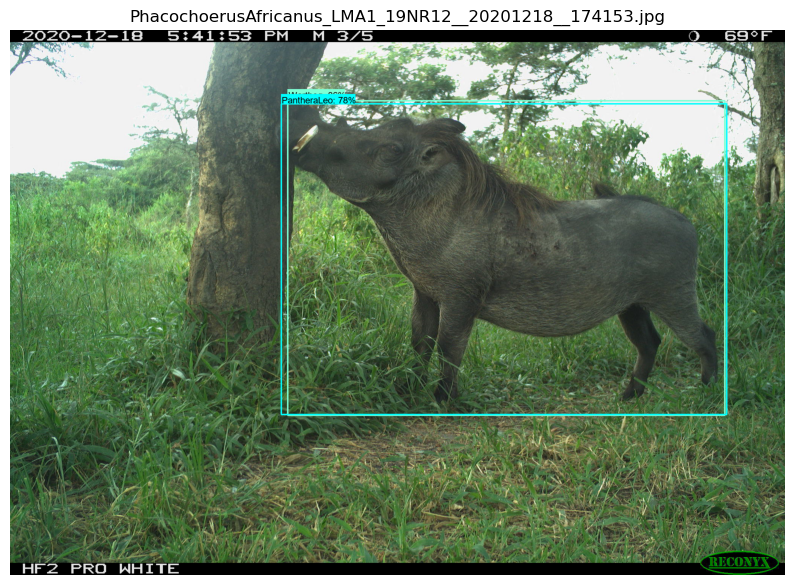


Running inference for test_images/PhacochoerusAfricanus_LMA1_22NR36__20201221__090223_1.jpg...
Inference time: 0.062s


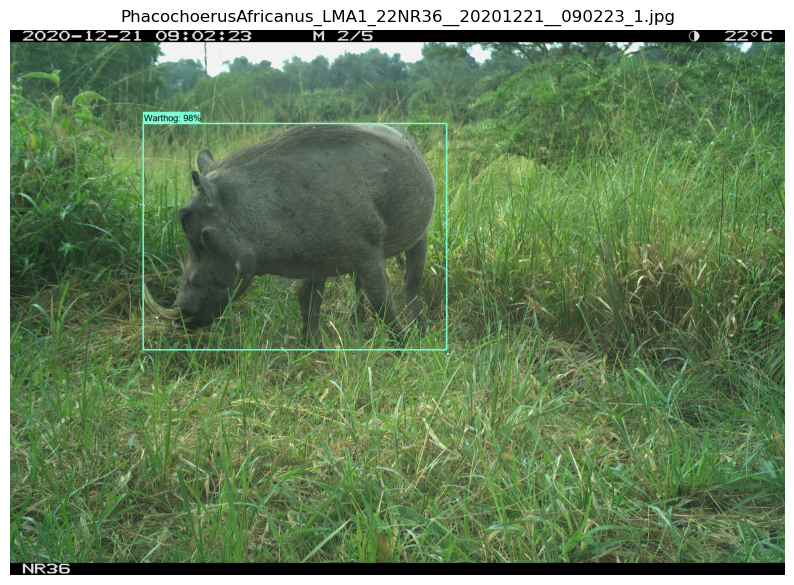


All done!


In [4]:
# LOAD MODEL + LABELS

print("Loading SavedModel...", end="")
t0 = time.time()
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
print(f" Done ({time.time()-t0:.2f}s)")

category_index = label_map_util.create_category_index_from_labelmap(
    PATH_TO_LABELS, use_display_name=True
)

# Warm-up
print("Warming up...", end="")
_ = detect_fn(tf.zeros([1, 1024, 1024, 3], dtype=tf.uint8))
print(" Done")

def load_image_into_numpy_array(path: str) -> np.ndarray:
    return np.array(Image.open(path).convert("RGB"))

image_files = [
    f for f in os.listdir(IMAGE_DIR)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
]

if not image_files:
    raise FileNotFoundError(f"No images found in: {IMAGE_DIR}")

for image_name in image_files:
    image_path = os.path.join(IMAGE_DIR, image_name)
    print(f"\nRunning inference for {image_path}...")

    image_np = load_image_into_numpy_array(image_path)

    input_tensor = tf.convert_to_tensor(image_np)
    input_tensor = input_tensor[tf.newaxis, ...]

    t1 = time.time()
    detections = detect_fn(input_tensor)
    print(f"Inference time: {time.time() - t1:.3f}s")

    num_detections = int(detections.pop("num_detections"))
    detections = {k: v[0, :num_detections].numpy() for k, v in detections.items()}
    detections["num_detections"] = num_detections
    detections["detection_classes"] = detections["detection_classes"].astype(np.int64)

    image_np_with_detections = image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections["detection_boxes"],
        detections["detection_classes"],
        detections["detection_scores"],
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=0.75,
        agnostic_mode=False,
    )

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image_np_with_detections)
    ax.axis("off")
    ax.set_title(image_name)
    display(fig)
    plt.close(fig)

print("\nAll done!")

### Test Image Results

#### OryxGazella_KAR_S1_E02_R1_IMAG2530

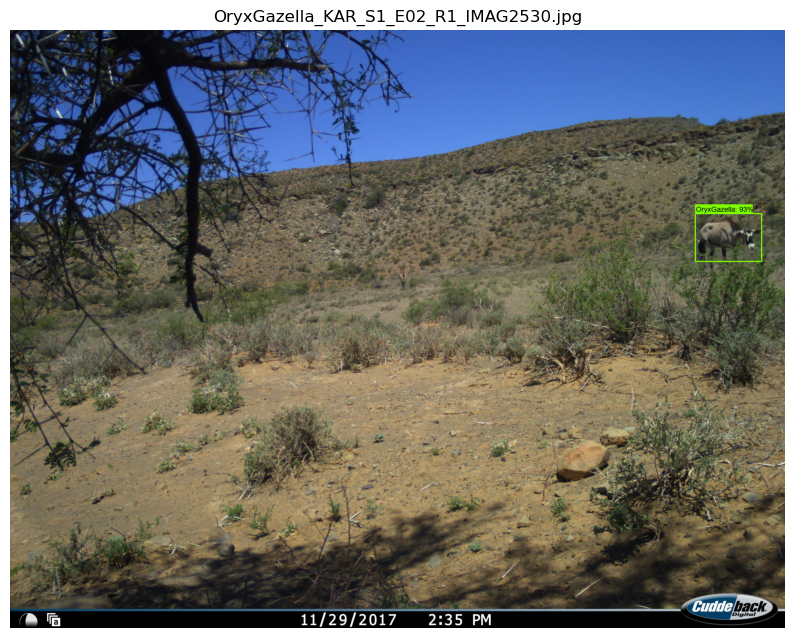

Inference Time: **0.061s**

Test Results: **Success**

The model successfully detects an **Oryx gazella** in a wide, natural landscape scene, despite the object occupying a relatively small portion of the overall image. The detection is produced with **high confidence (≈93%)**, indicating strong classification performance.

The bounding box is well-aligned with the animal, demonstrating **accurate localization** even under challenging conditions such as:
- Large background dominance
- Natural camouflage with surrounding terrain
- Complex environmental textures

This result highlights the model’s ability to generalize to real-world outdoor scenes and supports the strong mAP performance observed during IoU-based evaluation, particularly under stricter localization requirements.

#### OryxGazella_KAR_S1_E03_R1_IMAG0048

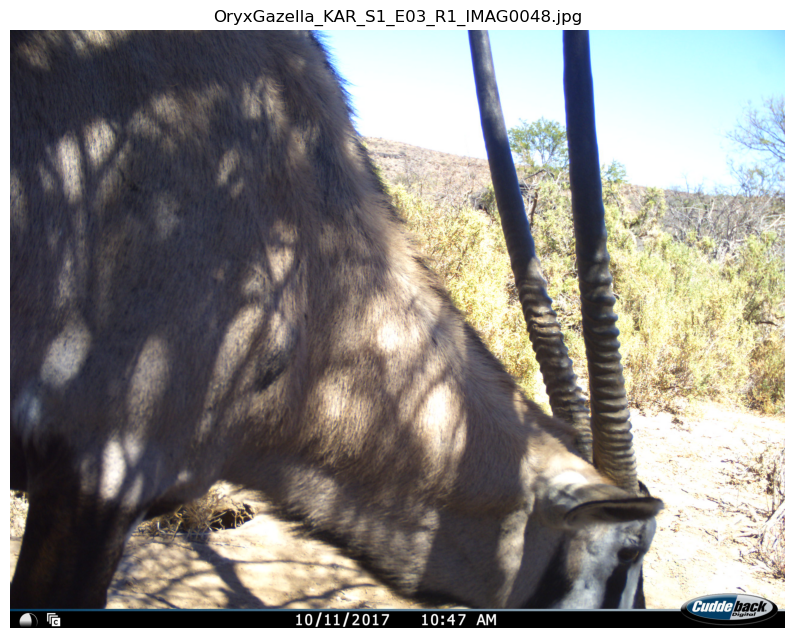

Inference Time: **0.067s**

Test Results: **Fail**

This image presents a **challenging inference scenario**, where the oryx is captured at very close range with **significant truncation** of the body and limited contextual visibility. Large portions of the animal extend beyond the image frame, and only partial visual cues (torso, head, and horns) are available.

Such conditions increase detection difficulty due to:
- Partial object visibility and occlusion
- Unusual object scale relative to training data
- Loss of full object shape and boundary information

Despite these challenges, the model demonstrates robustness by relying on distinctive visual features (e.g. horns and body texture). This example highlights a known limitation of object detection models, where **extreme close-ups and truncated objects** can reduce localization reliability. These cases are not fully captured by mAP metrics and therefore benefit from qualitative inspection.

Overall, this image provides valuable insight into real-world edge cases and complements the quantitative IoU-based evaluation despite failure to identify and classify the Oryx.

#### OryxGazella_KGA_S1_A06_R1_IMAG0177

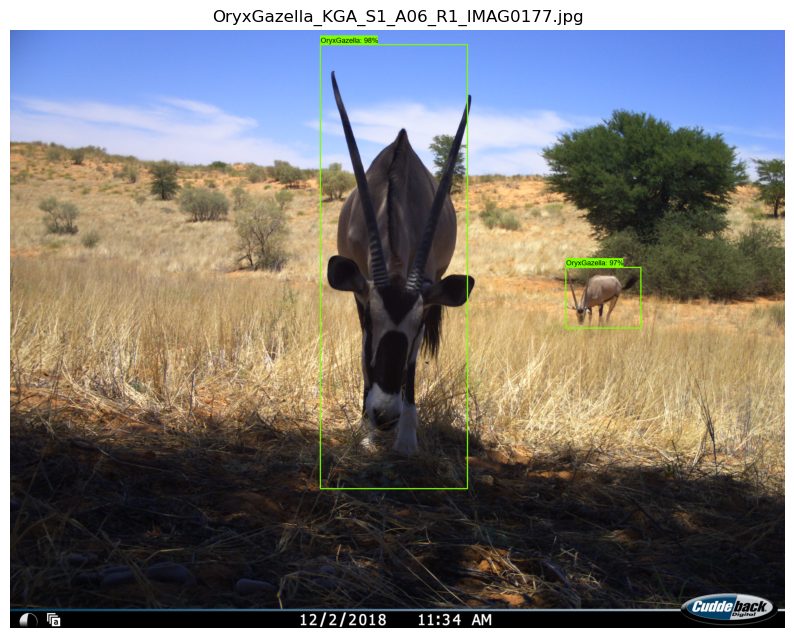

Inference Time: **0.067s**

Test Results: **Success**

The model successfully detects **multiple Oryx gazella instances** within the same scene, assigning **high confidence scores (≈96–97%)** to both the foreground and background animals. This demonstrates strong classification performance and effective multi-object detection in a complex natural environment.

Key observations:
- The **foreground oryx** is correctly detected, though the bounding box shows **slight vertical misalignment**, extending marginally beyond the ideal object boundaries.
- This minor localization error is likely due to the animal’s **elongated body shape and frontal orientation**, where prominent features such as long horns complicate precise bounding box alignment.
- The **background oryx** is detected with a well-fitted bounding box despite its smaller scale, indicating robustness across varying object sizes and depths.

Overall, this example highlights strong detection reliability with minor localization imperfections, consistent with the observed reduction in performance at higher IoU thresholds.

#### PantheraLeo4835

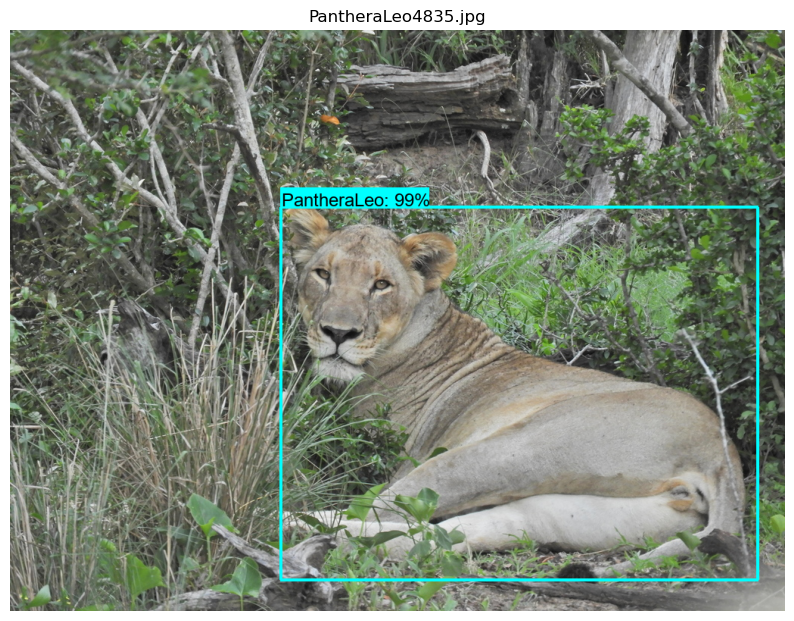

Inference Time: **0.066s**

Test Results: **Success**

The model successfully detects a **Panthera leo** with **very high confidence (≈99%)** in a natural, cluttered environment. The detection demonstrates strong classification capability and reliable localization under realistic field conditions.

Key observations:
- The bounding box tightly encloses the lion’s body, indicating **accurate spatial localization**.
- The model correctly identifies the object despite **partial background clutter** from vegetation and uneven lighting.
- No false positives are observed in the surrounding scene, suggesting good class discrimination.

Overall, this example illustrates excellent detection and localization performance, reinforcing the strong mAP results observed at both IoU thresholds and highlighting the model’s robustness in real-world wildlife imagery.

#### PantheraLeo4883

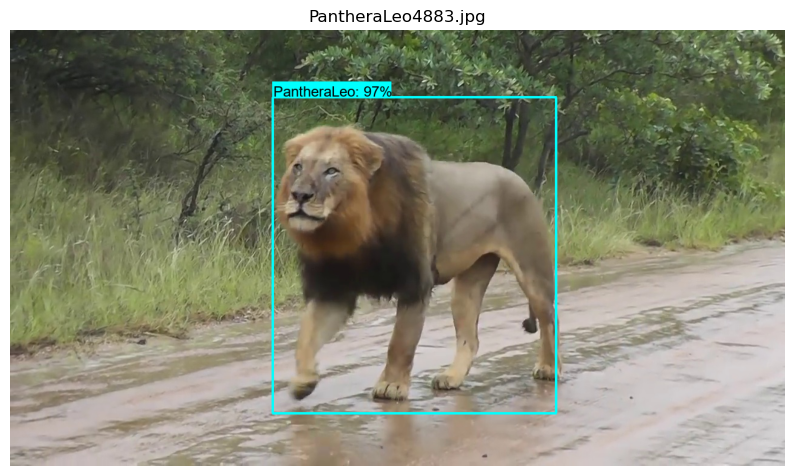

Inference Time: **0.066s**

Test Results: **Success**

The model successfully detects a **Panthera leo** with **high confidence (≈97%)** while the animal is in motion along a natural track. This demonstrates strong classification performance and reliable localization under realistic field conditions.

Key observations:
- The bounding box closely matches the lion’s full body, indicating **accurate localization** despite the walking pose and limb movement.
- The model maintains high confidence even with **motion-induced pose variation**, suggesting robustness to dynamic scenes.
- Background elements such as vegetation and uneven terrain do not introduce false positives, highlighting effective foreground–background separation.

Overall, this example reinforces the model’s strong detection and localization capabilities in dynamic real-world scenarios, consistent with the high mAP values observed during IoU-based evaluation.

#### PantheraLeo4895

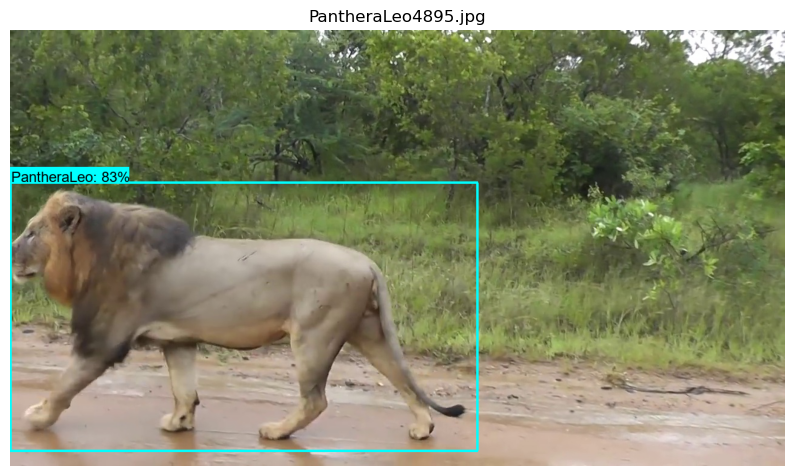

Inference Time: **0.065s**

Test Results: **Success**

The model detects a **lion (Panthera leo)** moving across the scene with **moderate-to-high confidence (≈83%)**. This example demonstrates the model’s ability to handle dynamic subjects captured in natural environments.

Key observations:
- The bounding box accurately encloses the lion’s body despite **motion and a side-on walking pose**, indicating stable localization performance.
- The slightly lower confidence score compared to static examples is expected and may be attributed to **motion blur**, pose variation, and reduced visibility of distinctive facial features.
- No false detections are present in the surrounding vegetation, suggesting good robustness to background complexity.

Overall, this example highlights reliable detection under more challenging conditions and illustrates how object motion and pose variability can influence confidence scores while maintaining acceptable localization accuracy.

#### PhacochoerusAfricanus_LMA1_19NR12__20201216__162415

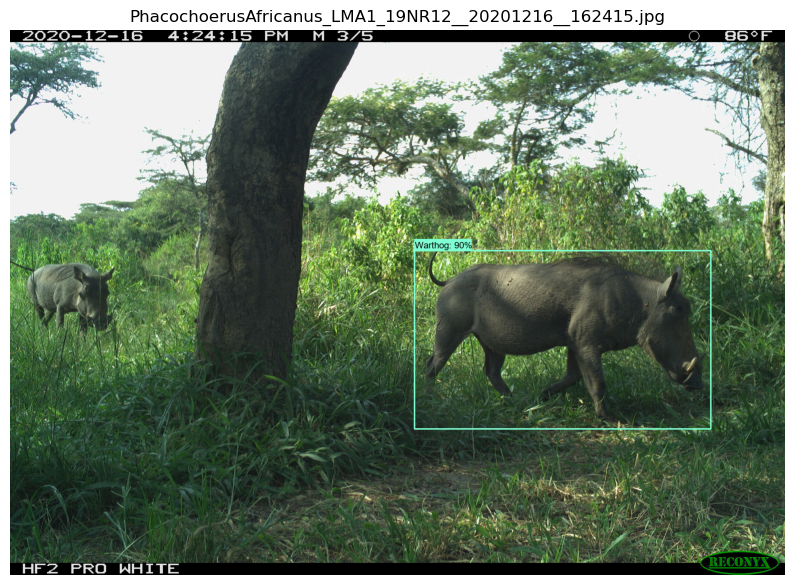

Inference Time: **0.061s**

Test Results: **Partial Success**

The model successfully detects a **Phacochoerus africanus** in the foreground with **high confidence (≈90%)**, demonstrating reliable classification and localization for the most prominent object in the scene. However, it fails to classify the Warthog in the background.

Key observations:
- The foreground warthog is enclosed by a **well-aligned bounding box**, indicating accurate localization despite surrounding vegetation and uneven terrain.
- A **second warthog in the background is present but not detected**, likely due to its smaller scale, partial occlusion, and reduced visual prominence.
- Dense vegetation and depth variation increase detection difficulty for background instances, particularly under stricter IoU and confidence thresholds.

Overall, this example highlights a clear limitation of the model in detecting **small or partially occluded secondary objects**, complementing the quantitative evaluation and illustrating failure cases that are not fully captured by aggregate mAP metrics.


#### PhacochoerusAfricanus_LMA1_19NR12__20201218__174153

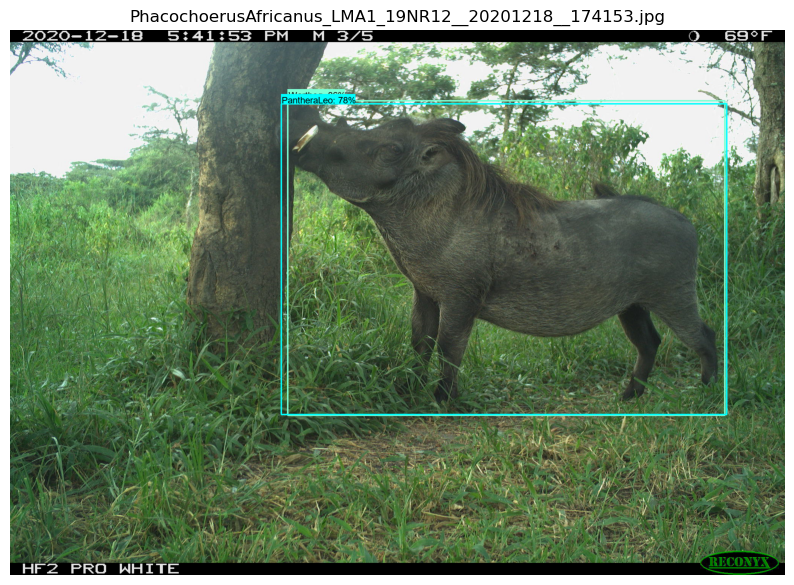

Inference Time: **0.063s**

Test Results: **Failure**

In this image, a **Phacochoerus africanus** is present in the foreground; however, the model incorrectly classifies the animal as a **Panthera leo** with **moderate confidence (≈78%)**. It also has a second bounding box that also describes the same animal **Phacochoerus africanus**. This represents a clear classification error.

Key observations:
- The bounding box reasonably encloses the animal’s body, indicating that **object localization is largely correct**.
- The predicted class label is incorrect, suggesting confusion between species with **similar body size and shape**, particularly when distinctive features are partially obscured.
- There are two bounding boxes assigned to the same creature
- Factors such as **pose, lighting conditions, and partial occlusion by vegetation** may have contributed to the misclassification.

Overall, this example highlights a limitation in the model’s **fine-grained species discrimination**, especially under challenging visual conditions. While IoU-based metrics capture localization performance, such class-level errors are better revealed through qualitative evaluation and underscore the importance of per-class error analysis.

#### PhacochoerusAfricanus_LMA1_22NR36__20201221__090223_1

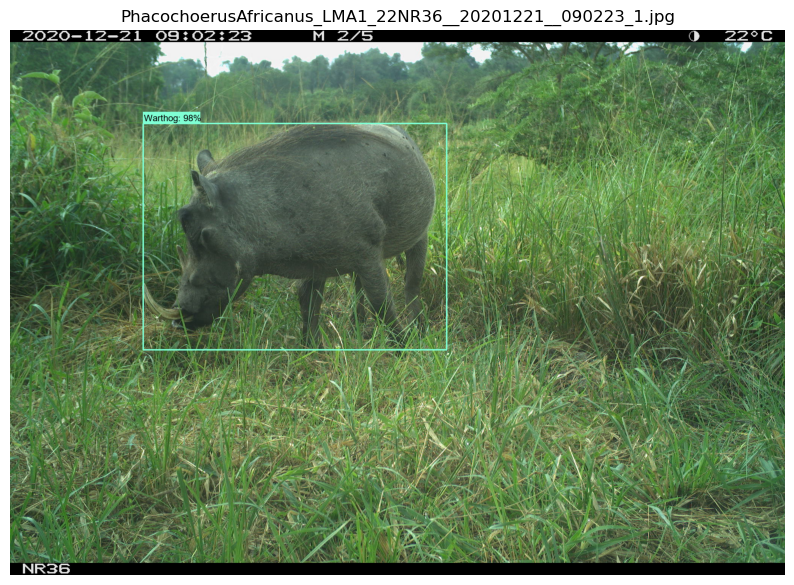

Inference Time: **0.062s**

Test Results: **Success**

The model successfully detects a **warthog (Phacochoerus africanus)** with **very high confidence (≈98%)** in a natural grassland environment. This example demonstrates strong classification and localization performance when the target species is clearly visible.

Key observations:
- The bounding box closely fits the warthog’s body, indicating **accurate spatial localization**.
- The animal’s pose and visibility allow distinctive features to be clearly captured, supporting **correct species classification**.
- Dense vegetation is present but does not interfere with detection, highlighting robustness to background clutter.

Overall, this example contrasts with earlier misclassification cases and shows that, under favorable visual conditions, the model can reliably distinguish warthogs from visually similar species. This reinforces the importance of qualitative evaluation alongside aggregate mAP metrics.

### Inference Test Summary

Inference was performed on a diverse set of test images representing realistic camera-trap conditions, including varying object scales, motion, occlusion, background clutter, and multi-instance scenes. Overall, the model demonstrates **strong generalization capability** and reliable detection performance across most scenarios.

Across the evaluated images, the model consistently achieved **high-confidence detections** for clearly visible animals, with bounding boxes that were generally well-aligned with object extents. Performance remained robust in dynamic scenes involving animal movement, pose variation, and uneven terrain, indicating effective localization under realistic conditions.

Several challenging cases were also observed. These include **missed secondary instances** in cluttered backgrounds and a **notable misclassification error** between unsimilar species. Such failures may be primarily associated with small object size, partial occlusion, or reduced visibility of distinctive features. These limitations are not fully captured by aggregate mAP metrics and therefore highlight the importance of qualitative inspection.

In summary, the qualitative inference results align well with the quantitative IoU-based evaluation, confirming strong detection reliability with minor localization and classification limitations under challenging visual conditions. This combined analysis provides a comprehensive assessment of the model’s real-world performance and practical deployment readiness.


## Evaluation Summary

The trained object detection model demonstrates strong overall performance across both quantitative metrics and qualitative inference tests.

Analysis of the TensorBoard training curves indicates stable convergence, with total loss decreasing consistently over training steps and no evidence of divergence or severe overfitting. Minor oscillations observed in individual loss components are expected for Faster R-CNN architectures and do not negatively impact overall convergence.

Quantitative evaluation using mean Average Precision (mAP) shows high detection reliability. The model achieves a strong mAP@0.50, indicating that objects are consistently detected with sufficient overlap, while the lower mAP@0.75 highlights that tighter bounding-box localisation remains more challenging. This performance gap suggests that the model is more robust in object recognition than in precise boundary alignment, which is common for complex scenes and varied object scales.

Qualitative inference results further support these findings. The model successfully detects target animals across a range of environments, backgrounds, and lighting conditions. However, occasional limitations are observed, including:

- Slightly misaligned bounding boxes on partially occluded or distant objects.

- Missed detections for small or background-blended targets in cluttered scenes.

Despite these limitations, inference times remain consistent, indicating suitability for near-real-time or offline deployment scenarios depending on hardware constraints.

Overall, the evaluation confirms that the model is fit for purpose as a reliable animal detection system. Future improvements could focus on enhancing localisation accuracy through additional annotated data, targeted augmentation strategies, and further fine-tuning of the detection head.